In [1]:
# 모든 모듈을 불러 옵니다. (LDA기본 셋팅값)

from modules import *
from tqdm import tqdm

### 분석하고자 하는 파일 입력
- 예제로 활용하는 데이터는 index당 하나의 document로 이루어져있으며 칼럼 이름은 sents 기준으로 코딩한다
- data 변수에 분석할 파일의 path를 입력

In [2]:
#파일 불러오기
data = pd.read_csv('./IITP_LDA.csv')
text_data = data.reset_index(drop=True)
text_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21119 entries, 0 to 21118
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   sents    21119 non-null  object
 1   cluster  21119 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 330.1+ KB


In [3]:
#이 데이터에서만 해줘야할 처리?
#사전에 클러스터링 한 결과가 있는 경우 활용
cluster = 0 #클러스터 번호수정
text_data = data[data['cluster']==cluster]
text_data = text_data.reset_index(drop=True)

### 2.한국어 토큰화
- 한국어 토큰을 완료한 후에 bigram과 tf-idf 점수를 기준으로 딕셔너리를 만들어 LDA에 적용될 수 있게 맵핑하는 작업

In [4]:
#원문 데이터를 한국어 형태소 기준으로 토큰화 진행
#기본 셋팅되어 있는 형태소는 명형동
#형태소 변경이 필요할 경우 module.py에서 변경
tokenizing_sent = []

for i in tqdm(text_data['sents']):
    tokenizing_sent.append(okt_pos_tagging(i))
text_data['tokenizing'] = tokenizing_sent

text_data #토큰화 된 결과값을 기존의 원문 파일 테이블에 추가

100%|██████████| 3614/3614 [05:16<00:00, 11.42it/s]


,sents,cluster,tokenizing
0,가서먹고 직장인 도시락다이어트 식단을 위한 바르닭 씨케이 편하게 먹기 좋은직장인 ...,0,"[직장인, 도시락, 다이어트, 식단, 바르다, 닭, 케이, 편하다, 먹기, 좋은직장..."
1,미트리 볶음밥 내돈내산 라희타 요즘 집에 이것저것 난리여서 챙것도 많고 살것도 많...,0,"[미트, 리, 볶음밥, 돈, 산, 희다, 타, 요즘, 집, 난리, 챙것, 많다, 살..."
2,삶의 현장 다이어트저녁식단 추천 워터포미 다이어트 도시락 후기 찐메이 찐하좋았던 ...,0,"[삶, 현장, 다이어트, 저녁, 식단, 추천, 워터, 밉다, 다이어트, 도시락, 후..."
3,음식 요리 가정간편식으로좋은 미스터네이처 냉동볶음밥 진 가정간편식으로좋은 미스터네...,0,"[음식, 요리, 가정, 간편식, 좋다, 미스터, 네이처, 냉동, 볶음밥, 진, 가정..."
4,요리같은 간편식 내돈내산 그리팅몰 프로틴업 단백질 도시락 반은 맛있고 반은 그닥 ...,0,"[요리, 간편식, 돈, 산, 그리팅, 몰다, 프로, 틴업, 단백질, 도시락, 반, ..."
...,...,...,...
3609,글라이드 메밀밥 다이어트식 즉석밥 추천해요 유노 건강식 간편밥 다이어트식글라이드 ...,0,"[글라이드, 메밀, 밥, 다이어트, 즉석밥, 추천, 유노, 건강, 간편, 밥, 다이..."
3610,다이어트도시락 윙잇 랠리 흑미곤약도시락으로 간편하게 데일리오프 다이어트 도시락 윙...,0,"[다이어트, 도시락, 윙, 잇다, 랠리, 밉다, 도시락, 간편하다, 일리, 오프, ..."
3611,맛집 마켓컬리 도시락 후기 알바하는 곳 구내식당이 동안 공사를 한다고 해서식단조절...,0,"[맛집, 마켓, 컬리, 도시락, 후기, 알바, 곳, 구내식당, 공사, 식단, 조절,..."
3612,내돈내산바르닭다이어트 도시락 식단 하면서 일일이 탄단지 챙겨 먹기 귀찮을 때는 도...,0,"[돈, 산, 바르다, 닭, 다이어트, 도시락, 식단, 일일이, 챙기다, 먹기, 귀찮..."


- bigram : 단어나 코튼이 2개가 나란히 있을 때를 말함. 단어의 쌍
- unigram(1단어)로 파악하지 못하는 원문의 맥락을 더 잡아내기 위해 bigram(또는 n-gram)을 사용하기도함

In [5]:
#bigram
#bigram을 적용하여 tf-idf 기준으로 토큰과 맵핑
#데이터프레임 형태의 tokenizing 된 단어들을 bigram 형태로 변환하기 위한 작업

texts = text_data['tokenizing']
bigram_result = bigram_(texts)

bigram_result

([[(0, 0.06221453707685981),
   (1, 0.07227354494412903),
   (2, 0.05695076411127887),
   (3, 0.03401359967325715),
   (4, 0.03087299950648357),
   (5, 0.030171514744107706),
   (6, 0.03566199168364528),
   (7, 0.05387165431410422),
   (8, 0.04217348516776145),
   (9, 0.06221453707685981),
   (10, 0.06221453707685981),
   (11, 0.05695076411127887),
   (12, 0.06221453707685981),
   (13, 0.06221453707685981),
   (14, 0.04115944521453603),
   (15, 0.06221453707685981),
   (16, 0.0406990606752696),
   (17, 0.03747248956216581),
   (18, 0.06221453707685981),
   (19, 0.021429809023083227),
   (20, 0.06221453707685981),
   (21, 0.039854411071847985),
   (22, 0.09487451626668479),
   (23, 0.06221453707685981),
   (24, 0.04642321818011697),
   (25, 0.03051416019385579),
   (26, 0.05387165431410422),
   (27, 0.05695076411127887),
   (28, 0.04400487444640088),
   (29, 0.037185888788593045),
   (30, 0.04860788134852328),
   (31, 0.06221453707685981),
   (32, 0.06221453707685981),
   (33, 0.0151277

### 3. LDA 토픽 갯수 테스트
#### perplexcity score & coherence score
- 적절한 Elbow point와 클러스터링 된 원문을 보고 적절한 토픽 갯수를 선정.
- check_topic_n 변수에 테스트 해볼 토픽의 갯수를 입력
- 이때 토픽의 갯수는 range를 사용해 입력

In [6]:
# 테스트 할 토픽의 갯수 입력. rage(사이 숫자 입력)
check_topic_n = range(3,11) #3개에서 10개까지


#### perplexcity score
- 군집의 복잡도를 의미 (낮을수록 좋다고 평가)

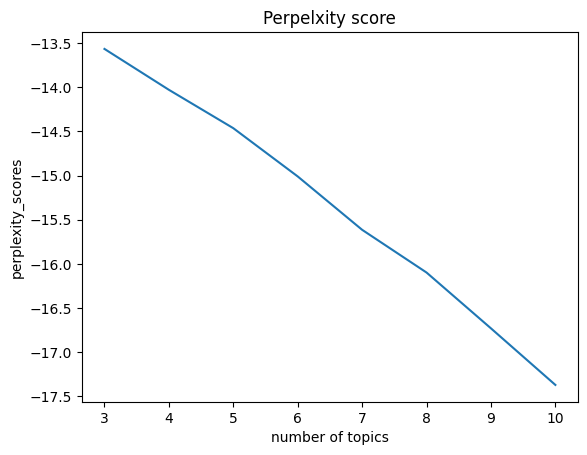

In [7]:
# 토픽의 갯수에 따라 달라지는 perplexcity 점수를 보여줌
# 해당 그래프는 PNG 파일로 저장
# 해당 그래프를 수치로 보여주는 table이 csv로 저장됨
perplexcity_graph(check_topic_n, bigram_result)


#### coherence score
- 군집의 일관성을 의미(높을수록 좋다고 평가)
- perplexcity와 coherence socre가 완벽한 정답은 아님, 결과를 보고 추가 판단 필요

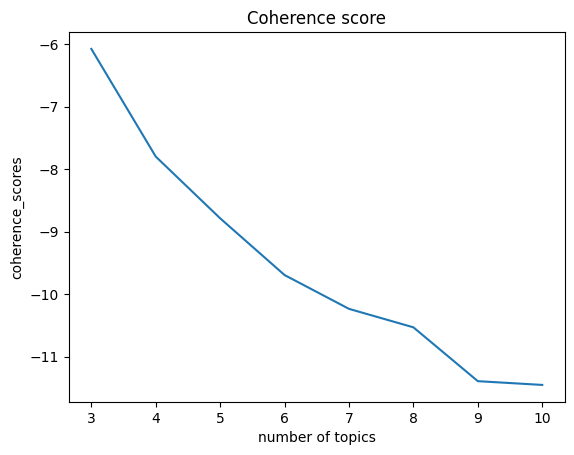

In [8]:
# 토픽의 갯수에 따라 달라지는 coherence 점수를 보여줌
# 해당 그래프는 PNG 파일로 저장
# 해당 그래프를 수치로 보여주는 table이 csv로 저장됨
coherence_graph(check_topic_n, bigram_result)

### 4. LDA 시각화 라이브러리 확인
- pyLDavis 라이브러리를 활용해 LDA를 시각화
- 해당 라이브러리가 잘 작동하는지 확인하고 토픽별 할당된 documents를 확인

#### 4.1 시각화에 필요한 라이브러리 실행 및 설치
- pyLDAvis 라이브러리가 존재하지 않을 경우 !pip3 install pyldavis

In [9]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

c:\Users\user\AppData\Local\Programs\Python\Python38\lib\site-packages\past\builtins\misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload


#### 4.2 라이브러리 테스트
- 아래 셀은 pyLDAvis 라이브러리 테스트 코드로 lda 시각화가 잘 실행되는지 확인용
- 해당 코드에서 오류나면 라이브러리가 제대로 설치 되었는지 확인 필요
- 오류가 발생하지 않는다면 아래 셀은 실행하지 않아도 좋음


In [10]:
model = LdaModel(bigram_result[0], num_topics=5, id2word=bigram_result[2])
visual = gensimvis.prepare(model, bigram_result[1], bigram_result[2])
pyLDAvis.display(visual)

### 5. LDA 시각화 실행 및 저장
- check_topic_n 에서 설정했던 토픽의 개수 별로 시각화 된 LDA가 저장
- 저장된 파일은 html 확장자를 가짐
- 만약 topic 개수를 새로 저장하고 싶다면 check_topic_n 대신 range(n,m)을 넣기
- 시각화 파일과 함께 대조하여 원문을 확인할 수 있도록 토픽 개수에 따른 원문도 저장됨

#### 5.1 토픽 할당, 할당된 document 추출(원문 검토시 활용)
- document 별로 해당하는 document가 몇 번 토픽에 할당되었는지를 보여줌
- topic_weight 컬럼은 topic 컬럼에서의 해당 토픽일 확률을 나타냄
- topic_all_weight 컬럼은 설정한 모든 토픽에 대하여 해당 document 가 각 토픽에 할당될 확률을 보여줌?

In [13]:
for i in tqdm(check_topic_n):
    #lda 시각화된 결과 저장
    model = LdaModel(bigram_result[0], num_topics=i, id2word=bigram_result[2])
    visual = gensimvis.prepare(model, bigram_result[1], bigram_result[2])
    pyLDAvis.save_html(visual, 'LDA토픽추출_시각화_topic_n{}.html'.format(i))
    # 저장할 파일 이름
    
    #lda 데이터 프레임 저장(원문,토픽 넘버 매칭)
    lda_result = exctract_topic(model, bigram_result[1])
    df = pd.concat([text_data, lda_result], axis=1)
    df.to_csv('LDA추출원문_topic_n{}.csv'.format(i), encoding='utf-8-sig')

100%|██████████| 8/8 [01:28<00:00, 11.05s/it]
